In [1]:
# Importing necessary libraries
import os
import shutil
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Define the input path and separate output paths for images and labels
input_path = "/kaggle/input/wadaba"
output_images_path = "/kaggle/working/wadaba/images"
output_labels_path = "/kaggle/working/wadaba/labels"

# Create output folders for images and labels if they don't exist
os.makedirs(output_images_path, exist_ok=True)
os.makedirs(output_labels_path, exist_ok=True)

# Iterate through each folder in the input path
for folder_name in os.listdir(input_path):
    folder_path = os.path.join(input_path, folder_name)

    # Check if it's a folder
    if os.path.isdir(folder_path):
        # Create corresponding folders in images and labels output directories
        image_dest_folder = os.path.join(output_images_path, folder_name)
        label_dest_folder = os.path.join(output_labels_path, folder_name)
        os.makedirs(image_dest_folder, exist_ok=True)
        os.makedirs(label_dest_folder, exist_ok=True)

        # Separate images and labels
        for file_name in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file_name)

            # If the file is an image, copy it to the images folder
            if file_name.endswith('.jpg') and os.path.isfile(file_path):
                shutil.copy(file_path, image_dest_folder)

            # If the file is a label, copy it to the labels folder
            elif file_name.endswith('.txt') and os.path.isfile(file_path):
                shutil.copy(file_path, label_dest_folder)

print("Images and labels have been separated into different directories.")


Images and labels have been separated into different directories.


In [3]:
# Define the path to your labels directory
labels_dir = "/kaggle/working/wadaba/labels"
# Iterate through each class folder in the labels directory
for folder in os.listdir(labels_dir):
    folder_path = os.path.join(labels_dir, folder)
    
    if os.path.isdir(folder_path):
        for label_file in os.listdir(folder_path):
            if label_file.endswith('.txt'):
                label_file_path = os.path.join(folder_path, label_file)
                
                # Read the existing labels
                with open(label_file_path, 'r') as f:
                    lines = f.readlines()

                # Modify the labels
                new_lines = []
                for line in lines:
                    parts = line.split()
                    # Assuming the first part is the class index
                    if len(parts) > 0:
                        # Convert class index from zero-padded string to integer
                        class_index = int(parts[0]) - 1  # Convert to 0-index
                        new_line = f"{class_index} " + " ".join(parts[1:]) + "\n"
                        new_lines.append(new_line)

                # Write back the modified labels
                with open(label_file_path, 'w') as f:
                    f.writelines(new_lines)

print("Label files updated.")

Label files updated.


In [4]:

# Define the data directories
parent_dir = "/kaggle/working/wadaba/images"  # Directory where image folders are located
label_dir = "/kaggle/working/wadaba/labels"  # Directory where label folders are located
train_dir = "/kaggle/working/wadaba/train"
val_dir = "/kaggle/working/wadaba/val"

# Create directories for training and validation if they don't exist
for folder in ['PS', 'PET', 'PP', 'Other', 'PE_HD']:
    os.makedirs(os.path.join(train_dir, folder), exist_ok=True)
    os.makedirs(os.path.join(val_dir, folder), exist_ok=True)

# Function to split dataset
def split_dataset(image_list, split_ratio=0.8):
    train_size = int(len(image_list) * split_ratio)
    train_files, val_files = train_test_split(image_list, train_size=train_size, shuffle=True)
    return train_files, val_files

# Iterate through each class folder and split images and their corresponding labels
for folder in ['PS', 'PET', 'PP', 'Other', 'PE_HD']:
    folder_path = os.path.join(parent_dir, folder)
    label_folder_path = os.path.join(label_dir, folder)

    # Collect all .jpg files
    all_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

    # Split into train and validation sets
    train_files, val_files = split_dataset(all_files)

    # Move training files (images and corresponding labels)
    for file_name in train_files:
        # Copy image
        shutil.copy(os.path.join(folder_path, file_name), os.path.join(train_dir, folder, file_name))
        # Copy corresponding label (if exists)
        label_file_name = file_name.replace('.jpg', '.txt')
        if os.path.exists(os.path.join(label_folder_path, label_file_name)):
            shutil.copy(os.path.join(label_folder_path, label_file_name), os.path.join(train_dir, folder, label_file_name))

    # Move validation files (images and corresponding labels)
    for file_name in val_files:
        # Copy image
        shutil.copy(os.path.join(folder_path, file_name), os.path.join(val_dir, folder, file_name))
        # Copy corresponding label (if exists)
        label_file_name = file_name.replace('.jpg', '.txt')
        if os.path.exists(os.path.join(label_folder_path, label_file_name)):
            shutil.copy(os.path.join(label_folder_path, label_file_name), os.path.join(val_dir, folder, label_file_name))

print("Dataset splitting complete.")

Dataset splitting complete.


# YOLO Model

In [5]:
# setup
%pip install ultralytics
import ultralytics
ultralytics.checks()


Ultralytics 8.3.15 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


In [6]:
dataset_yaml = """
train: /kaggle/working/wadaba/train
val: /kaggle/working/wadaba/val

nc: 7  # number of classes
names: [ 'PET', 'PE_HD', 'PVC', 'PE_LD','PP', 'PS', 'Other']  # class names
"""

with open('/kaggle/working/yolov10n.yaml', 'w') as file:
    file.write(dataset_yaml)

In [7]:
from ultralytics import YOLO

# Load the trained YOLO model
model = YOLO('yolov10n.pt')
data_yaml_path = "/kaggle/working/yolov10n.yaml"



results = model.train(data = data_yaml_path,
            epochs=20,
            device=0,
            lr0=0.01,  # initial learning rate
            lrf=0.001,  # final learning rate
            save_period=10
           )

100%|██████████| 5.59M/5.59M [00:00<00:00, 65.7MB/s]


Ultralytics 8.3.15 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/kaggle/working/yolov10n.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True

100%|██████████| 755k/755k [00:00<00:00, 14.4MB/s]
2024-10-18 09:42:20,804	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-18 09:42:21,781	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1      9856  ultralytics.nn.modules.block.SCDown          [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1     36096  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 69.2MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/wadaba/train/Other... 3199 images, 2 backgrounds, 0 corrupt: 100%|██████████| 3200/3200 [00:03<00:00, 926.70it/s]


train: New cache created: /kaggle/working/wadaba/train/Other.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/wadaba/val/Other... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<00:00, 908.21it/s] 

val: New cache created: /kaggle/working/wadaba/val/Other.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.99G      2.105      7.635      2.608         36        640: 100%|██████████| 200/200 [01:10<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:11<00:00,  2.18it/s]

                   all        800        800      0.562      0.473      0.409      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.01G      2.106      4.985      2.528         38        640: 100%|██████████| 200/200 [01:09<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:09<00:00,  2.51it/s]

                   all        800        800      0.636      0.502      0.493      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.01G      2.118      3.433      2.487         33        640: 100%|██████████| 200/200 [01:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.36it/s]

                   all        800        800      0.597      0.471      0.495      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         3G      2.103      2.539      2.438         36        640: 100%|██████████| 200/200 [01:06<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.47it/s]

                   all        800        800      0.734      0.615      0.644      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         3G      2.028       2.17      2.392         32        640: 100%|██████████| 200/200 [01:07<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:09<00:00,  2.50it/s]

                   all        800        800      0.769      0.593      0.594      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         3G       1.99      1.887      2.345         40        640: 100%|██████████| 200/200 [01:09<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.38it/s]

                   all        800        800      0.825      0.666      0.715      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         3G      1.963      1.701      2.313         39        640: 100%|██████████| 200/200 [01:07<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.45it/s]

                   all        800        800      0.857      0.642      0.733       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         3G      1.943       1.58       2.31         32        640: 100%|██████████| 200/200 [01:06<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.36it/s]

                   all        800        800      0.865      0.701      0.807      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         3G      1.902      1.484      2.277         37        640: 100%|██████████| 200/200 [01:07<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.39it/s]

                   all        800        800      0.926       0.67      0.794      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         3G      1.924      1.472      2.287         30        640: 100%|██████████| 200/200 [01:11<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.31it/s]

                   all        800        800      0.892        0.7      0.803      0.641


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.98G      1.647      1.155      2.171         16        640: 100%|██████████| 200/200 [01:10<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.36it/s]

                   all        800        800      0.654      0.839      0.807      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.98G      1.642      1.062      2.156         16        640: 100%|██████████| 200/200 [01:06<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.40it/s]

                   all        800        800      0.754       0.82      0.841      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.98G      1.607     0.9654      2.149         16        640: 100%|██████████| 200/200 [01:04<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.47it/s]

                   all        800        800      0.804      0.791      0.853      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.98G      1.588     0.9117      2.124         16        640: 100%|██████████| 200/200 [01:06<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.35it/s]

                   all        800        800      0.784      0.843      0.858        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.98G      1.577     0.8234      2.105         16        640: 100%|██████████| 200/200 [01:06<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.41it/s]

                   all        800        800      0.742       0.83      0.843      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.98G       1.56     0.7845      2.097         16        640: 100%|██████████| 200/200 [01:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.40it/s]

                   all        800        800      0.905      0.948       0.97      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.98G      1.524     0.7278      2.062         16        640: 100%|██████████| 200/200 [01:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.48it/s]

                   all        800        800      0.899       0.93      0.969      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.98G      1.507     0.6963      2.066         16        640: 100%|██████████| 200/200 [01:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.47it/s]

                   all        800        800      0.925      0.934       0.97      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.98G       1.48     0.6438      2.042         16        640: 100%|██████████| 200/200 [01:05<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.31it/s]

                   all        800        800      0.921      0.973      0.987      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.98G      1.466     0.6206      2.034         16        640: 100%|██████████| 200/200 [01:05<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.49it/s]

                   all        800        800      0.962      0.935      0.985      0.803



20 epochs completed in 0.449 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.15 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,697,146 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


                   all        800        800      0.962      0.935      0.985      0.803
                   PET        440        440      0.978      0.991      0.995      0.818
                 PE_HD        120        120          1       0.98      0.995       0.85
                    PP        128        128      0.897      0.891       0.97      0.782
                    PS        104        104      0.933      0.962      0.984      0.796
                 Other          8          8          1      0.854      0.982      0.766
Speed: 0.1ms preprocess, 2.3ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg1,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg2,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
metrics/mAP50(B),▁▂▂▄▃▅▅▆▆▆▆▆▆▆▆█████
metrics/mAP50-95(B),▁▂▂▃▃▅▅▅▆▆▆▆▆▇▆█████
metrics/precision(B),▁▂▂▄▅▆▆▆▇▇▃▄▅▅▄▇▇▇▇█
metrics/recall(B),▁▁▁▃▃▄▃▄▄▄▆▆▅▆▆█▇▇█▇
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,████▇▇▆▆▆▆▃▃▃▂▂▂▂▁▁▁


## Model Evaluation

In [14]:
from PIL import Image

In [15]:
tpaths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)

print(tpaths2[0])

/kaggle/working/runs/detect/train/F1_curve.png


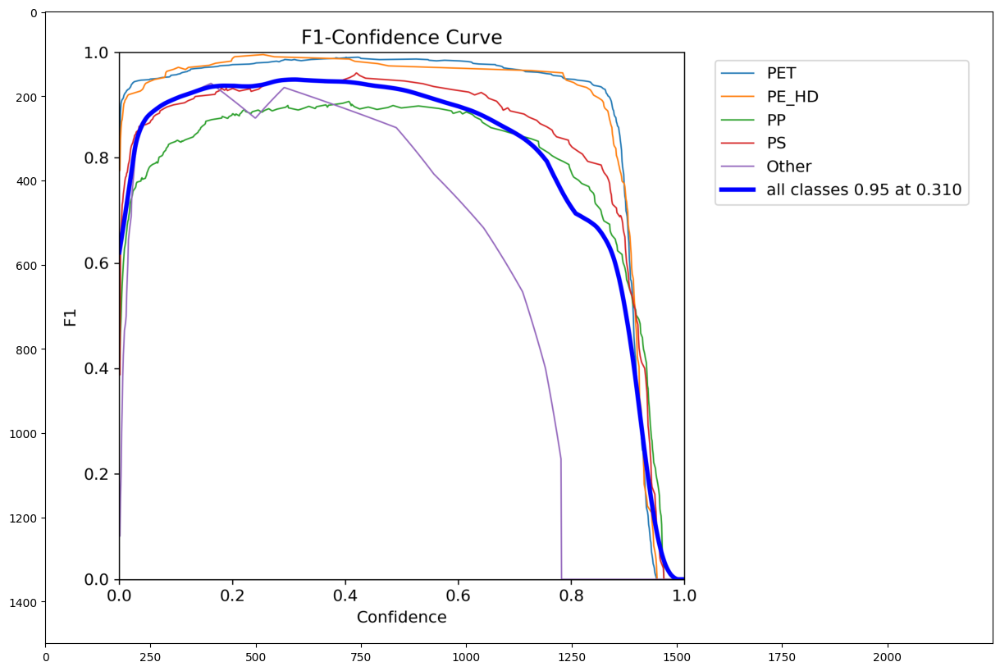

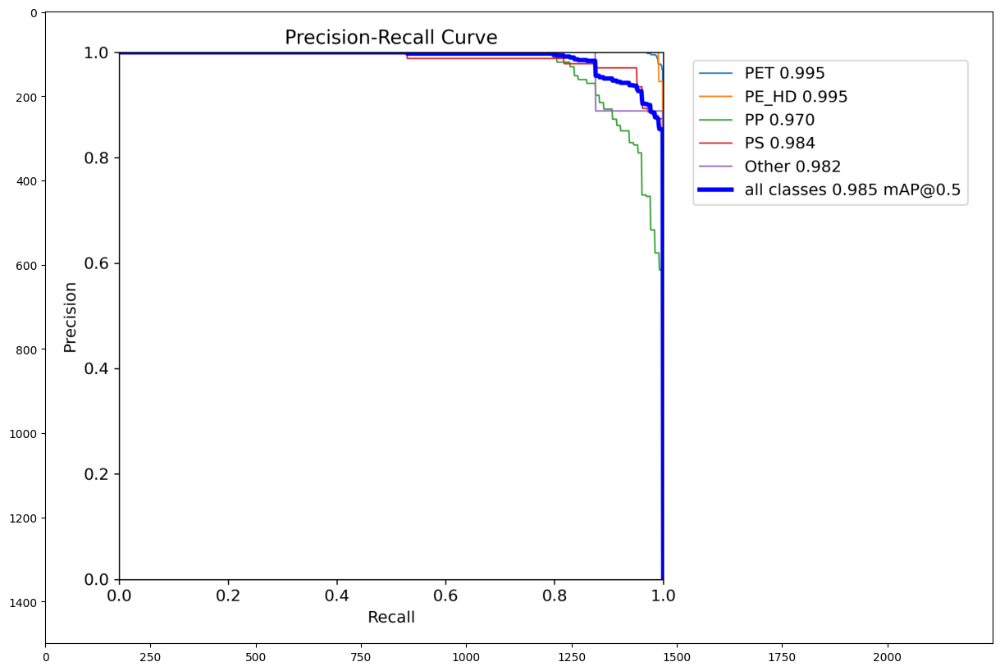

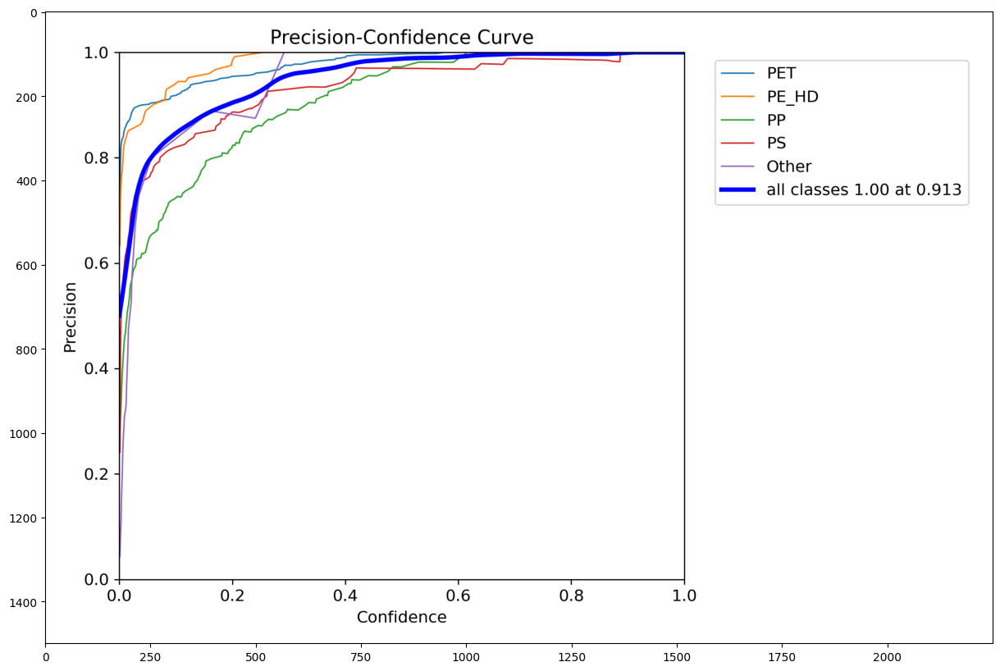

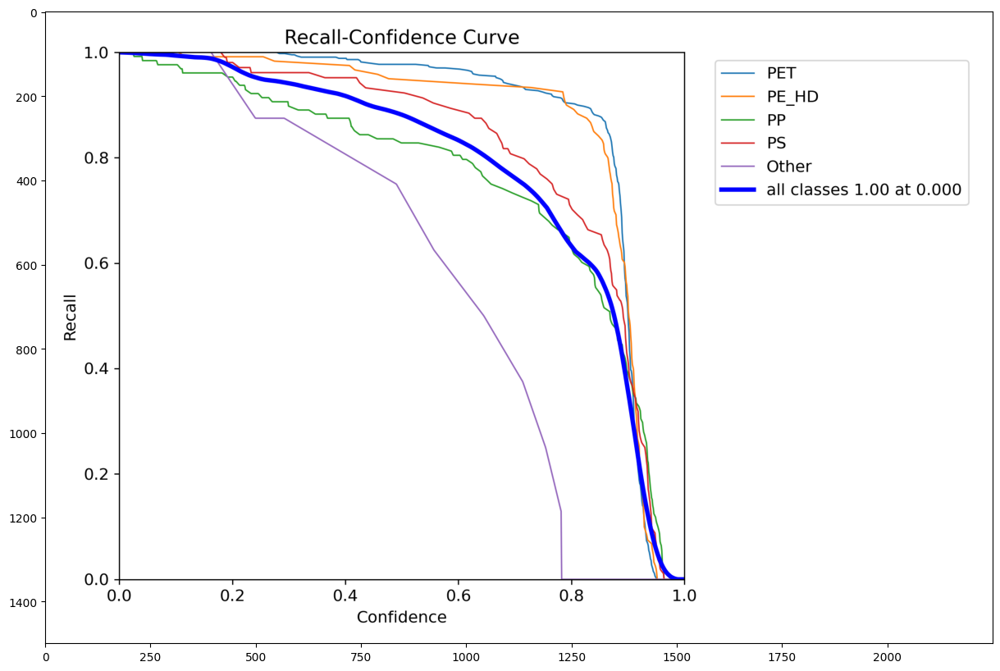

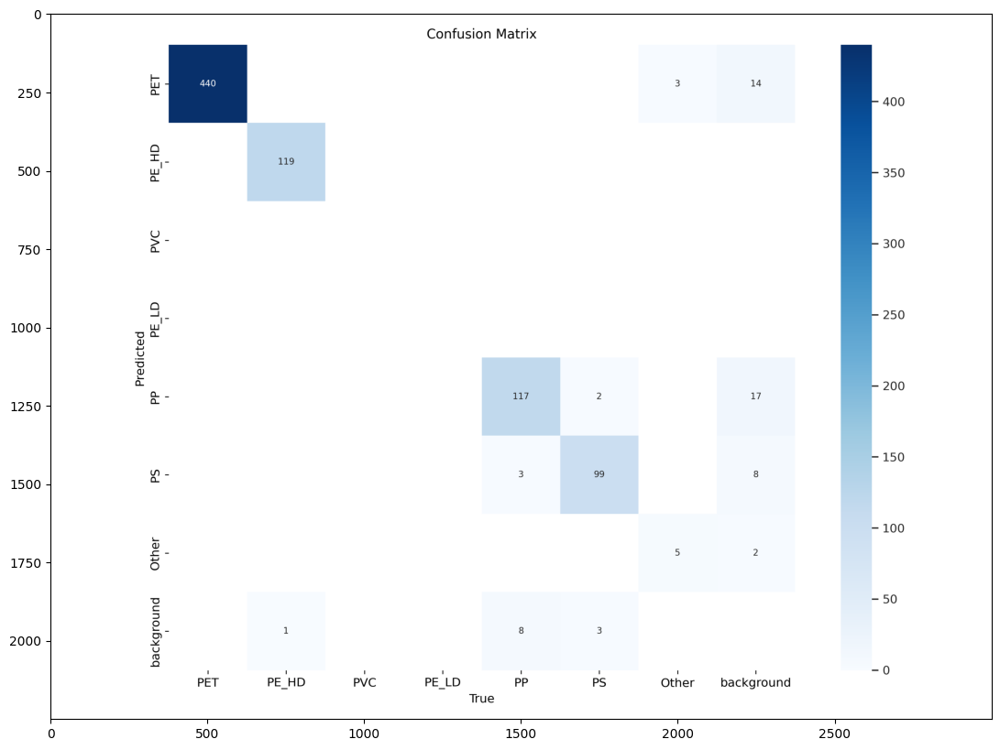

...

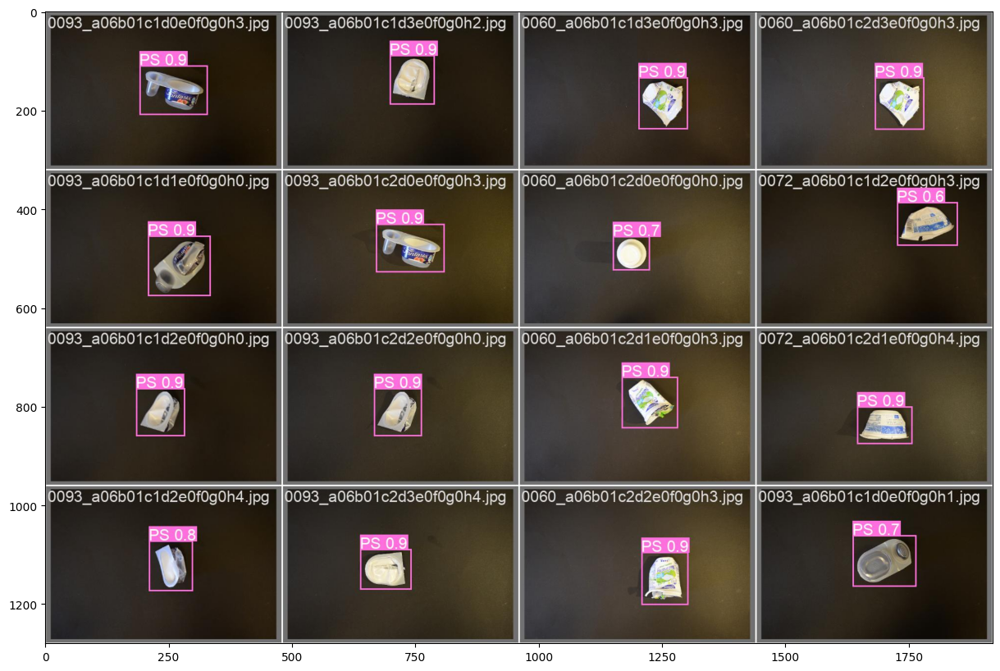

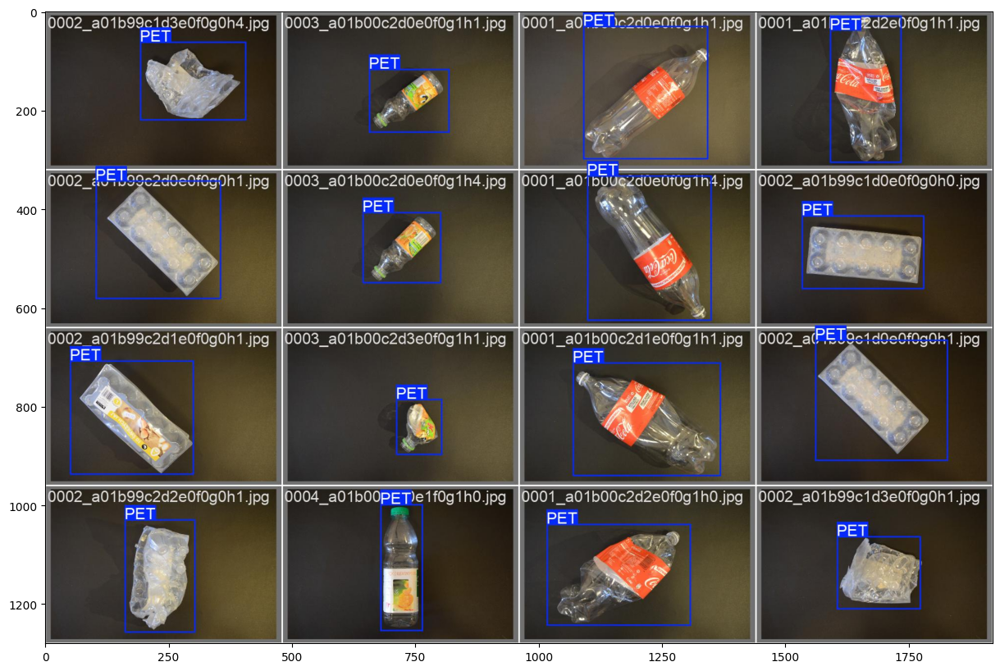

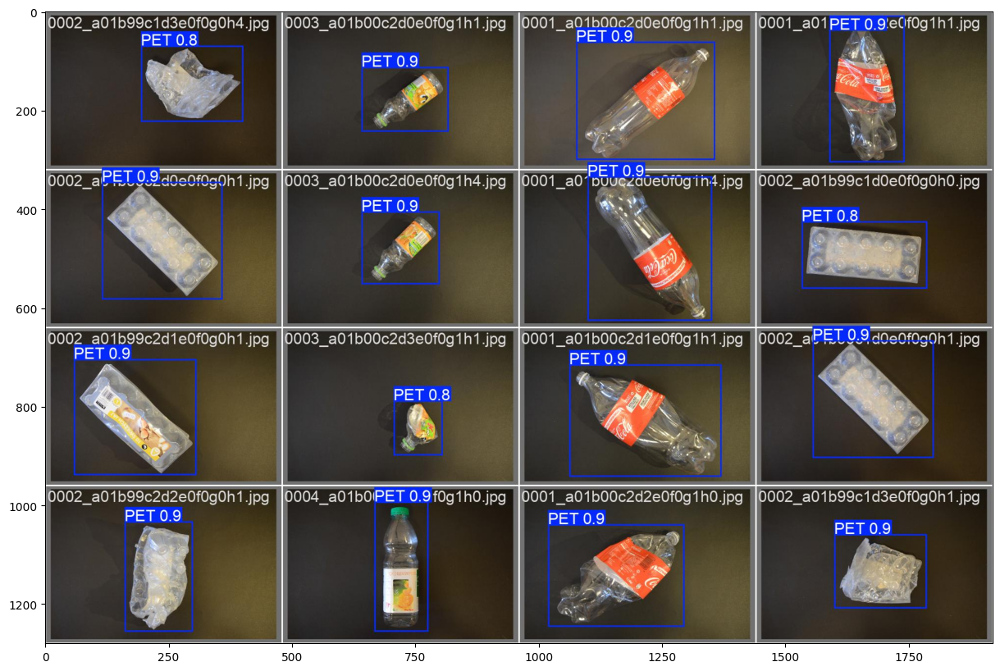

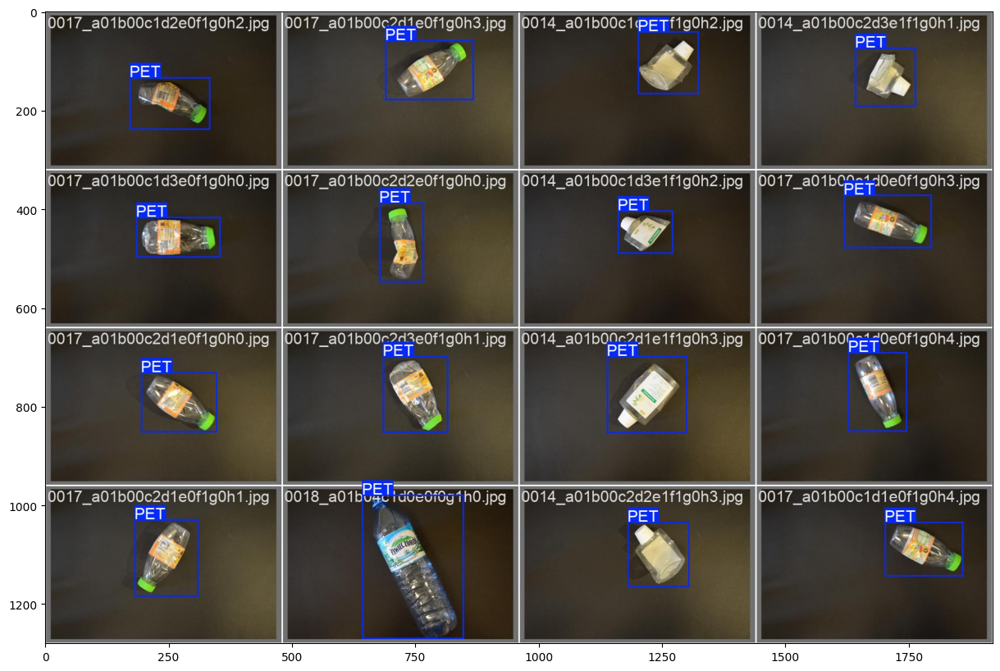

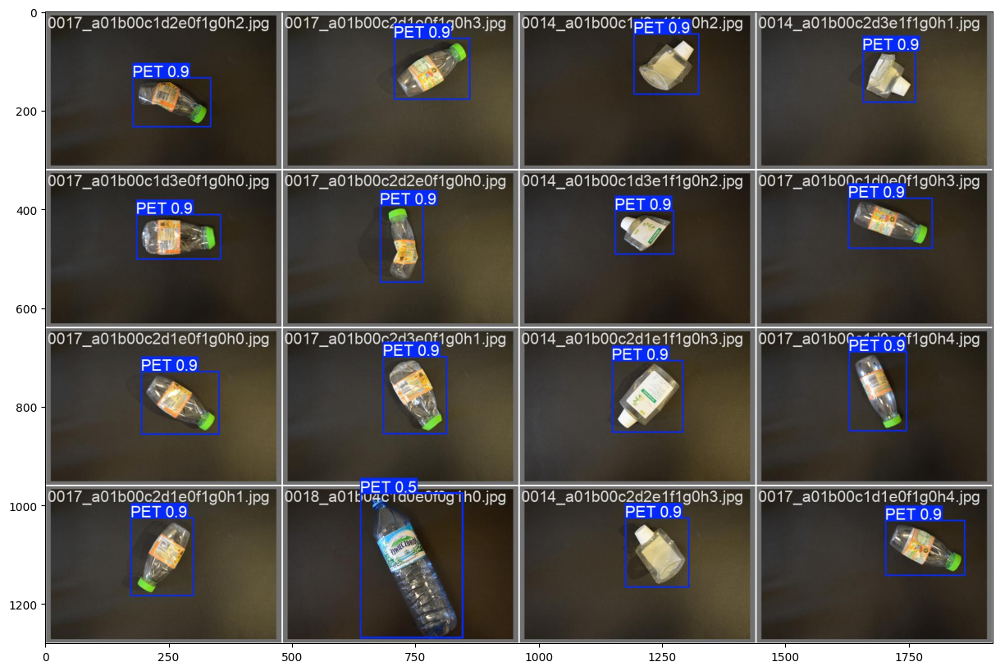

In [10]:
for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [11]:
# evaluate model performance on the validation set
results = model.val() 

Ultralytics 8.3.15 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,697,146 parameters, 0 gradients, 8.2 GFLOPs


val: Scanning /kaggle/working/wadaba/val/Other.cache... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:12<00:00,  4.05it/s]


                   all        800        800      0.962      0.935      0.985      0.803
                   PET        440        440      0.978      0.992      0.995      0.819
                 PE_HD        120        120          1       0.98      0.995       0.85
                    PP        128        128      0.897      0.891       0.97      0.781
                    PS        104        104      0.934      0.962      0.984      0.797
                 Other          8          8          1      0.853      0.982      0.766
Speed: 0.2ms preprocess, 3.3ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/train2


In [12]:
# Access precision, recall, and F1-score
# metrics = results['metrics']  # Contains metrics like precision, recall, and F1-score

# Access precision, recall, and F1-score for all classes
precision = results.box.mean_results()[0]  # mean precision
recall = results.box.mean_results()[1]     # mean recall
f1_score = results.box.mean_results()[2]   # mean F1-score

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")


Precision: 0.9616
Recall: 0.9353
F1-score: 0.9851


In [13]:
# Calculate approximate accuracy
# Accuracy = (TP) / (TP + FP + FN)
accuracy = (precision * recall) / (precision + recall - (precision * recall))
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.9016
